<a href="https://colab.research.google.com/github/CWASM/goes16-viz/blob/main/GOES_16_geospatial_and_temporal_understanding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Twitter API

In [ ]:
!pip install tweepy~=4.8

     |████████████████████████████████| 77 kB 3.0 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: tweepy
    Found existing installation: tweepy 4.0.0
    Uninstalling tweepy-4.0.0:
      Successfully uninstalled tweepy-4.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import tweepy
tweepy.__version__

'4.8.0'

In [ ]:
bearer_token = ""
client = tweepy.Client(bearer_token=bearer_token)

## Event

[February 13–17, 2021 North American winter storm](https://en.wikipedia.org/wiki/February_13%E2%80%9317,_2021_North_American_winter_storm) (aka Winter Storm Uri)

### Radar data

To visualize day-by-day impact of Uri, checkout ECCC's historic radar [visualizer](https://climate.weather.gc.ca/radar/index_e.html?site=NAT&year=2021&month=2&day=16&hour=00&minute=00&duration=24&image_type=PRECIPET_SNOW_WEATHEROFFICE)

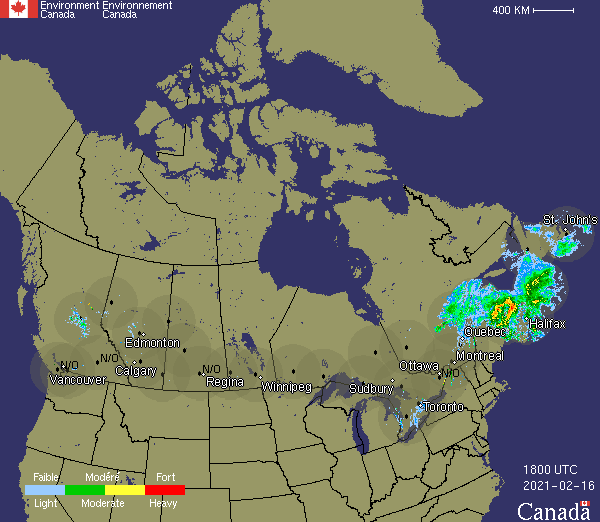

### Satellite IR data

In [ ]:
from datetime import date, datetime, timedelta
from PIL import Image
from IPython.display import Image as ipyImage
import requests
from pathlib import Path
from tqdm import tqdm, tqdm_notebook

In [ ]:
def goe16_ir_generator(start_date: date, end_date: date):
  delta = timedelta(days=1)
  while start_date <= end_date:
    dstr = start_date.strftime("%Y-%m-%d")
    for h in range(0, 24, 3):
      hstr = str(h)
      hstr = f"0{hstr}" if len(hstr) == 1 else hstr
      id = f"{dstr}-{hstr}"
      print(f"\rGetting image {id}", end="")
      # load from disk if already scraped
      fp = f"goe16_{id}.jpeg"
      if Path(fp).exists():
        im = Image.open(fp)
      # scrape from url
      else:
        url = f"https://www.ncdc.noaa.gov/gibbs/image/GOE-16/IR/{id}"
        im = Image.open(requests.get(url, stream=True).raw)
        im.save(f"goe16_{id}.jpeg")
      yield im
    start_date += delta


In [ ]:
def get_goe16_ir_gif(start_date: str, end_date: str, fps=10, res=250):
  fp = f"./goe16_{start_date}_{end_date}_fps={fps}_{res}x{res}.gif"
  if not Path(fp).exists():
    d1 = datetime.strptime(start_date, "%Y-%m-%d").date()
    d2 = datetime.strptime(end_date, "%Y-%m-%d").date()
    num_frames = (d2 - d1).days * 24/3
    duration = num_frames / fps
    img_gen = (im.resize((res,res)) for im in goe16_ir_generator(d1, d2))
    img = next(img_gen)
    img.save(fp=fp, format='GIF', append_images=img_gen,
             optimizer=True, save_all=True,
             duration=duration, loop=0)
  display(ipyImage(open(fp,'rb').read()))

Getting image 2021-02-18-21

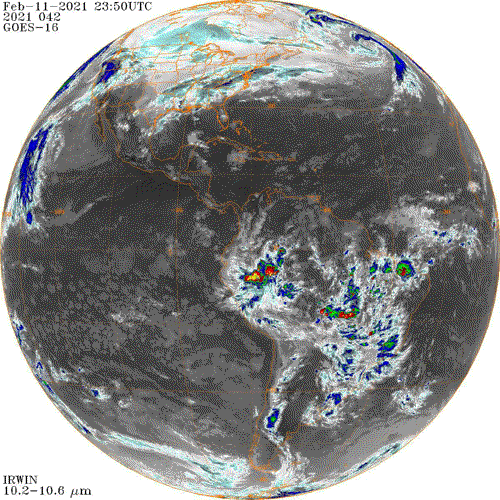

In [ ]:
get_goe16_ir_gif("2021-02-12", "2021-02-18", fps=5, res=500)

### Tweet Search

In [ ]:
keyword_list = [
  "snowmageddon",
  "snowpocalypse",
  "snoverkill",
  "snomg",
  "kaisersnoze",
  "snowicane",
  "ice",
]

exact_phrase_match_list = [
  "blizzard warning",
  "winter storm warning",
  "freezing rain",
]

exact_phrase_match_exclude_list = [
  '"ice cream"',
]
  exact_phrase_match_list = [f'"{x}"' for x in exact_phrase_match_list]

  query = f"({' OR '.join(keyword_list + exact_phrase_match_list)}) -is:retweet"
query += f" -({' OR '.join(exact_phrase_match_exclude_list)})"
print(query)

start_time="2009-12-12T00:00:00.000Z"
end_time="2010-01-31T00:00:00.000Z"

(snowmageddon OR snowpocalypse OR snoverkill OR snomg OR kaisersnoze OR snowicane OR ice OR "blizzard warning" OR "winter storm warning" OR "freezing rain") -is:retweet -("ice cream")


In [ ]:
out = client.search_all_tweets(query=query, start_time=start_time, end_time=end_time, max_results=100)

In [ ]:
for tweet in out.data:
  print(tweet.text)
  print("-"*80)

Look but could not find the #rva tweeters at 3monkeys. Oops Went to Starlite for some black bean nachos and citrus vodka w/ cranberry. snomg
--------------------------------------------------------------------------------
Before it all stopped freezing rain was coming down. Temp is 20 out there now and those unscraped roads are definitely going to be slick.
--------------------------------------------------------------------------------
JKL cancels Winter Storm Warning for  Bell, Harlan, Leslie, Martin [KY]
--------------------------------------------------------------------------------
lying in bed, writing papers, avoiding requests to leave the house #snomg
--------------------------------------------------------------------------------
JKL extends time of Winter Storm Warning for  Floyd, Knott, Letcher, Perry, Pike [KY]  till 11:00 PM EST
--------------------------------------------------------------------------------
It started snowing again! #snOMG
--------------------------------